In [1]:
!pip install opencv-python
!pip install matplotlib
!pip install tqdm

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import math
from matplotlib import pyplot as plt
from IPython import display
import numpy as np
import cv2
import random
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
from PIL import Image
Image.MAX_IMAGE_PIXELS = None #set this or Pillow with think it's a decompression bomb DOS attack.
PATH = os.getcwd()







2024-07-29 23:23:07.810196: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 23:23:07.824929: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 23:23:07.824963: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 23:23:07.834750: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-29 23:23:08.471535: W tensorflow/compiler/tf

In [3]:


# Check for GPU availability
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# Allow memory growth for the GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Optionally, restrict TensorFlow to only use one GPU
if gpus:
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

Num GPUs Available:  1


2024-07-29 23:23:09.413132: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:09.431838: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:09.431890: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.


In [4]:
def align_landcover_to_satellite(satellite_img, landcover_img, max_shift=20):
    # Convert images to grayscale for alignment
    satellite_gray = cv2.cvtColor(satellite_img, cv2.COLOR_BGR2GRAY)
    landcover_gray = cv2.cvtColor(landcover_img, cv2.COLOR_BGR2GRAY)
    
    # Ensure both images have the same size for template matching
    h, w = satellite_gray.shape
    landcover_gray = cv2.resize(landcover_gray, (w, h), interpolation=cv2.INTER_LINEAR)
    landcover_img = cv2.resize(landcover_img, (w, h), interpolation=cv2.INTER_LINEAR)
    
    # Perform template matching
    result = cv2.matchTemplate(satellite_gray, landcover_gray, cv2.TM_CCOEFF_NORMED)
    _, _, _, max_loc = cv2.minMaxLoc(result)
    
    # Calculate the shift (inverted direction)
    dx, dy = -(max_loc[0] - max_shift), -(max_loc[1] - max_shift)
    #print(f"Alignment shift: dx={dx}, dy={dy}")
    
    # Apply alignment to landcover
    M = np.float32([[1, 0, dx], [0, 1, dy]])
    aligned_landcover = cv2.warpAffine(landcover_img, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))
    
    # Find the bounding box of the non-black region in the aligned landcover
    non_black = cv2.findNonZero(cv2.cvtColor(aligned_landcover, cv2.COLOR_BGR2GRAY))
    x, y, w, h = cv2.boundingRect(non_black)
    
    # Trim both images
    trimmed_landcover = aligned_landcover[y:y+h, x:x+w]
    trimmed_satellite = satellite_img[y:y+h, x:x+w]

    # Resize
    trimmed_satellite = cv2.resize(trimmed_satellite, (256,256), interpolation=cv2.INTER_AREA)
    trimmed_landcover = cv2.resize(trimmed_landcover, (256,256), interpolation=cv2.INTER_AREA)
    
    return trimmed_satellite, trimmed_landcover

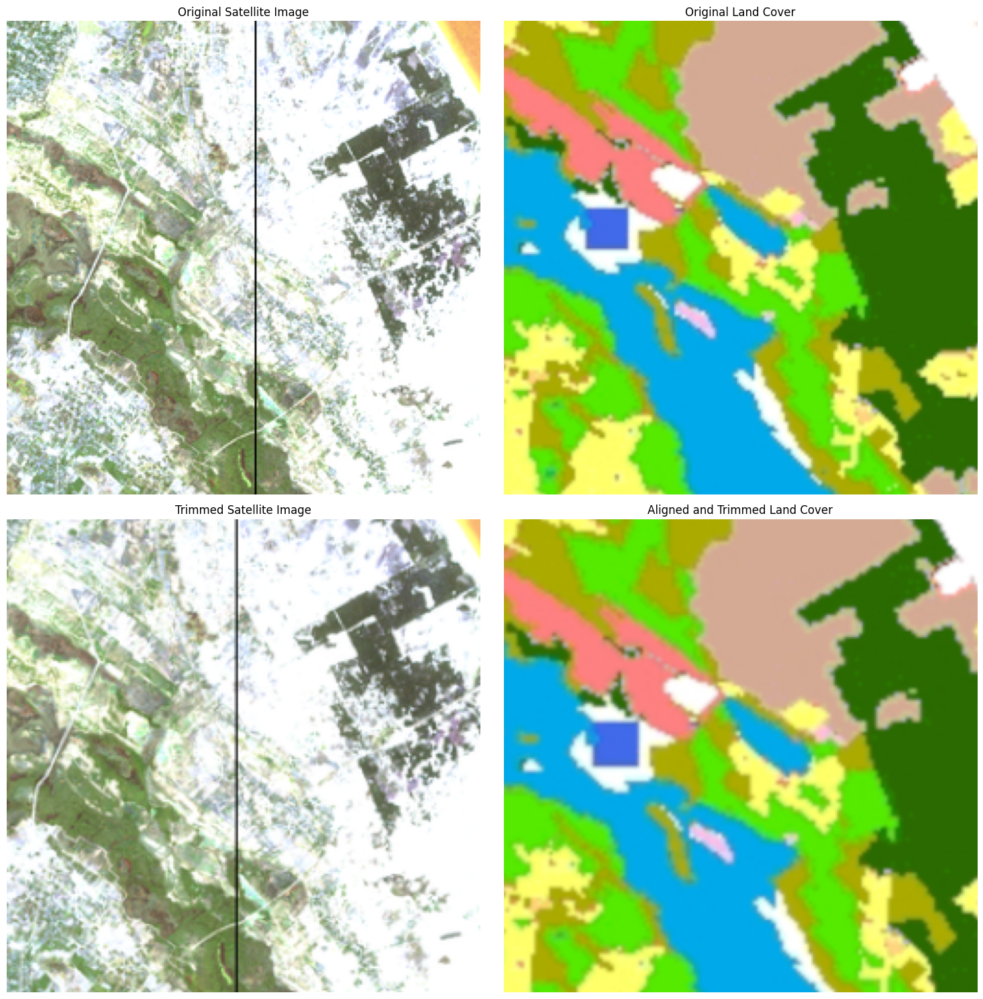

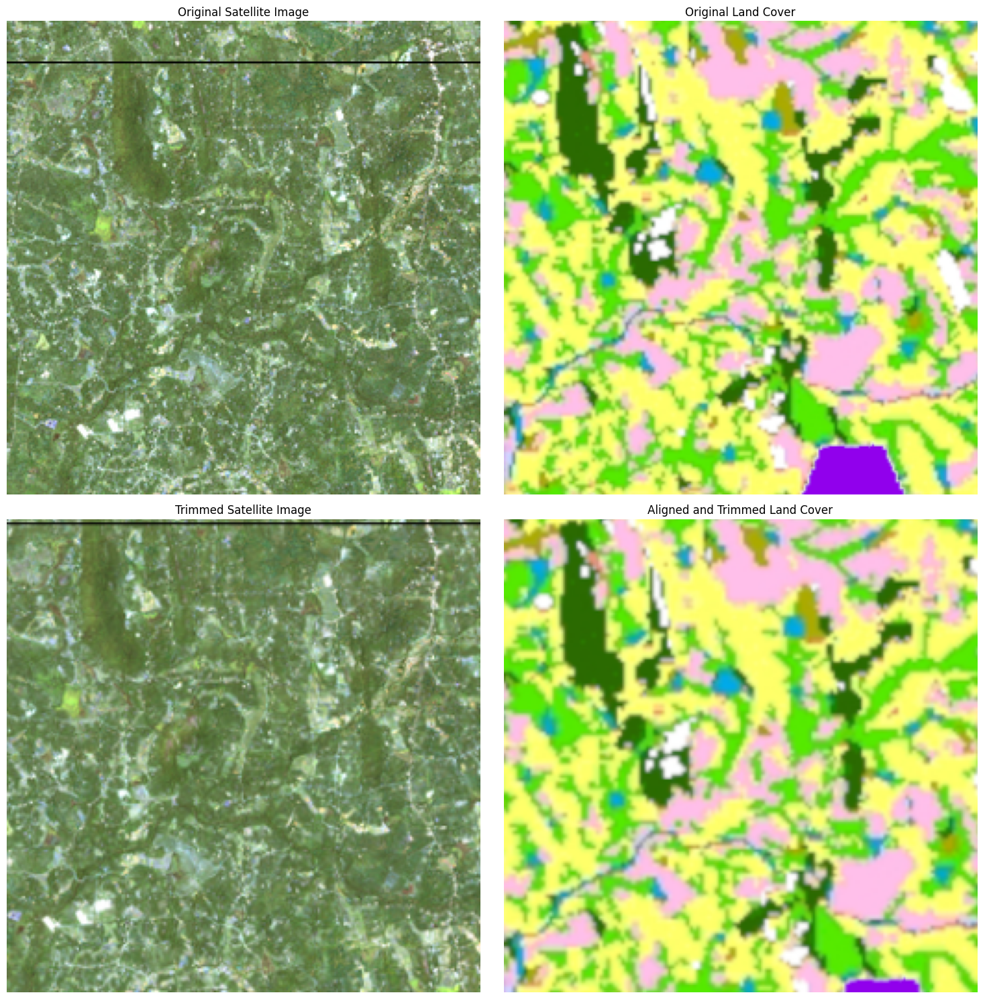

In [5]:
#TEST FUNCTION
def display_alignment(original_satellite, original_landcover, trimmed_satellite, trimmed_landcover):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))
    
    ax1.imshow(cv2.cvtColor(original_satellite, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Satellite Image')
    ax1.axis('off')
    
    ax2.imshow(cv2.cvtColor(original_landcover, cv2.COLOR_BGR2RGB))
    ax2.set_title('Original Land Cover')
    ax2.axis('off')
    
    ax3.imshow(cv2.cvtColor(trimmed_satellite, cv2.COLOR_BGR2RGB))
    ax3.set_title('Trimmed Satellite Image')
    ax3.axis('off')
    
    ax4.imshow(cv2.cvtColor(trimmed_landcover, cv2.COLOR_BGR2RGB))
    ax4.set_title('Aligned and Trimmed Land Cover')
    ax4.axis('off')
    
    plt.tight_layout()
    plt.show()



satellite_img = cv2.imread(os.path.join(PATH, 'in_tiles', 'tile_0062.png'))
landcover_img = cv2.imread(os.path.join(PATH, 'out_tiles', 'tile_0062.png'))

trimmed_satellite, trimmed_landcover = align_landcover_to_satellite(satellite_img, landcover_img)
display_alignment(satellite_img, landcover_img, trimmed_satellite, trimmed_landcover)

satellite_img = cv2.imread(os.path.join(PATH, 'in_tiles', 'tile_1945.png'))
landcover_img = cv2.imread(os.path.join(PATH, 'out_tiles', 'tile_1945.png'))

trimmed_satellite, trimmed_landcover = align_landcover_to_satellite(satellite_img, landcover_img)
display_alignment(satellite_img, landcover_img, trimmed_satellite, trimmed_landcover)

In [6]:
def load(image_file):
    try:
        image_file = tf.convert_to_tensor(image_file, dtype=tf.string)
        
        # Read and decode the input image file to a uint8 tensor
        input_image = tf.io.read_file(image_file)
        input_image = tf.io.decode_jpeg(input_image)
        #input_image = tf.image.resize(input_image, [256,256])
        # Construct the path for the corresponding file in the out_tiles folder
        out_file_path = tf.strings.regex_replace(image_file, 'in_tiles', 'out_tiles')
        
        # Read and decode the output image file to a uint8 tensor
        out_image = tf.io.read_file(out_file_path)
        out_image = tf.io.decode_jpeg(out_image)
        #out_image = tf.image.resize(out_image, [256,256])
        # Define a function to perform alignment, trimming, and resizing
        def align_and_process(input_image, out_image):
            try:
                # Convert tensors to numpy arrays for OpenCV operations
                input_np = input_image.numpy()
                out_np = out_image.numpy()
                
                # Perform alignment, trimming, and resizing
                aligned_input, aligned_out = align_landcover_to_satellite(input_np, out_np)
                
                return aligned_input, aligned_out
            except Exception as e:
                print(f"Error in align_and_process: {str(e)}")
                return None, None

        # Use tf.py_function to wrap the numpy operations
        aligned_input, aligned_out = tf.py_function(
            align_and_process,
            [input_image, out_image],
            [tf.uint8, tf.uint8]
        )
        
        # Check if alignment was successful
        if aligned_input is None or aligned_out is None:
            print(f"Alignment failed for image: {image_file}")
            return None
        
        # Ensure that the shapes are set after py_function
        aligned_input.set_shape(input_image.shape)
        aligned_out.set_shape(out_image.shape)
        
        # Convert both images to float32 tensors
        input_image = tf.cast(aligned_input, tf.float32)
        out_image = tf.cast(aligned_out, tf.float32)
        
        return input_image, out_image
    except Exception as e:
        print(f"Error processing image {image_file}: {str(e)}")
        return None

# Wrapper function to handle None returns
def load_image_train(image_file):
    result = load(image_file)
    if result is None:
        # Return a default value or raise an exception
        raise ValueError(f"Failed to load image: {image_file}")
    return result

2024-07-29 23:23:11.696288: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:11.696364: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:11.696394: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:11.852379: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:04:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-29 23:23:11.852438: I external/local_xla/xla/stream_executor

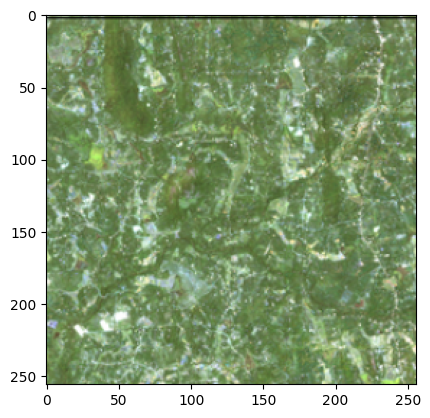

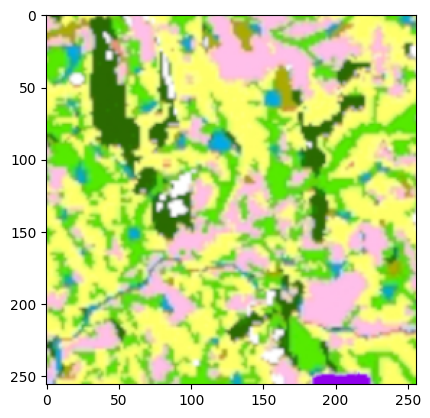

In [7]:
#TEST FUNCTION

input_image_path = os.path.join(PATH, 'in_tiles', 'tile_1945.png')
inp, re = load(input_image_path)

# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [8]:
# dataset size
BUFFER_SIZE = 3400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

def resize(input_image, out_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  out_image = tf.image.resize(out_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, out_image

def random_crop(input_image, out_image):
  stacked_image = tf.stack([input_image, out_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1]
def normalize(input_image, out_image):
  input_image = (input_image / 127.5) - 1
  out_image = (out_image / 127.5) - 1

  return input_image, out_image


@tf.function()
def random_jitter(input_image, out_image):
  # Resizing to 286x286
  input_image, out_image = resize(input_image, out_image, 286, 286)

  # Random cropping back to 256x256
  input_image, out_image = random_crop(input_image, out_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    out_image = tf.image.flip_left_right(out_image)

  return input_image, out_image

def split_data(data):
    test_data = []
    train_data = []
    
    for item in data:
        if random.random() < 0.2:  # 20% chance
            test_data.append(item)
        else:
            train_data.append(item)
    
    return train_data, test_data

def load_image_train(image_file):
  input_image, out_image = load(image_file)
    
  input_image, out_image = random_jitter(input_image, out_image)
  input_image, out_image = normalize(input_image, out_image)

  return input_image, out_image

def load_image_test(image_file):
  input_image, out_image = load(image_file)
  input_image, out_image = resize(input_image, out_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, out_image = normalize(input_image, out_image)

  return input_image, out_image




In [9]:
tf.experimental.numpy.experimental_enable_numpy_behavior()
# Create the initial dataset
dataset = tf.data.Dataset.list_files(os.path.join('in_tiles', '*.png'))

# Shuffle the dataset
dataset = dataset.shuffle(buffer_size=10000)

# Calculate the number of samples
total_samples = tf.data.experimental.cardinality(dataset).numpy()
train_size = int(0.8 * total_samples)  # 80% for training

# Split the dataset
train_dataset = dataset.take(train_size)
test_dataset = dataset.skip(train_size)

# Apply image_load to both datasets
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

# Apply prefetch to both datasets
train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE)

In [10]:
# Print dataset sizes (optional)
print(f"Number of training samples: {tf.data.experimental.cardinality(train_dataset)}")
print(f"Number of test samples: {tf.data.experimental.cardinality(test_dataset)}")

Number of training samples: 2720
Number of test samples: 680


In [11]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)



def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)




def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)


generator = Generator()


2024-07-29 23:23:13.476966: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


(1, 128, 128, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


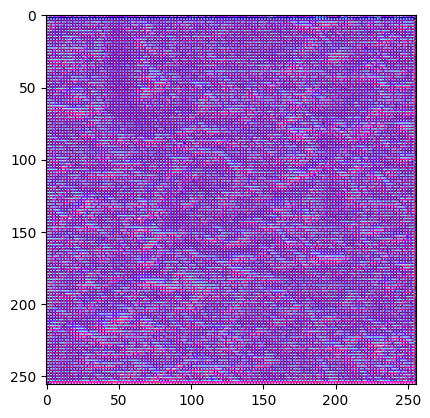

In [12]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [13]:
LAMBDA = 100

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [14]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()

In [15]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

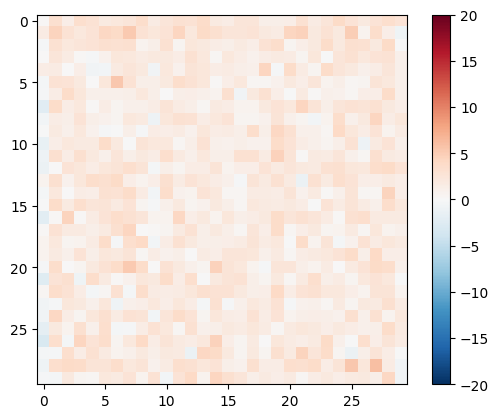

In [16]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [17]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [18]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

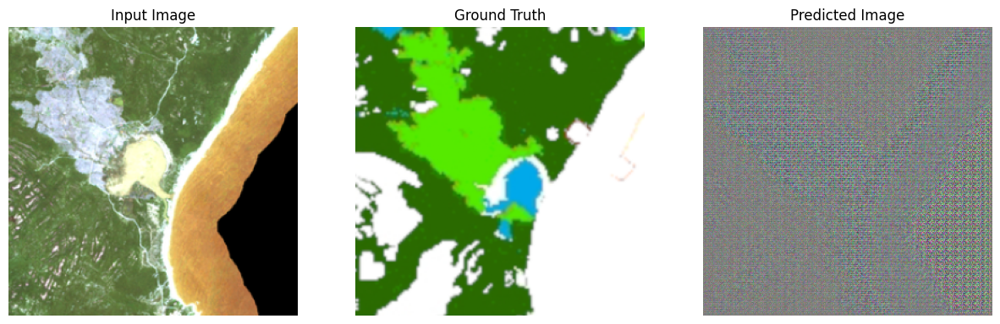

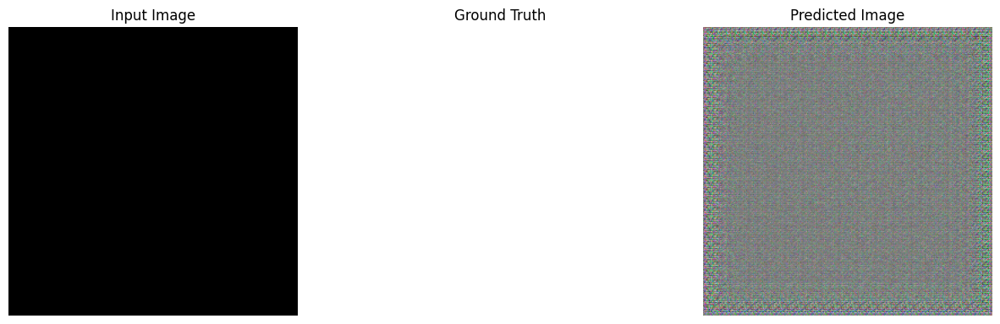

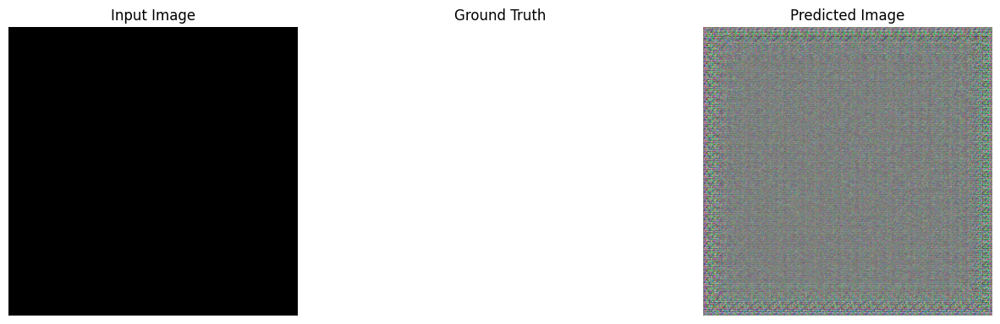

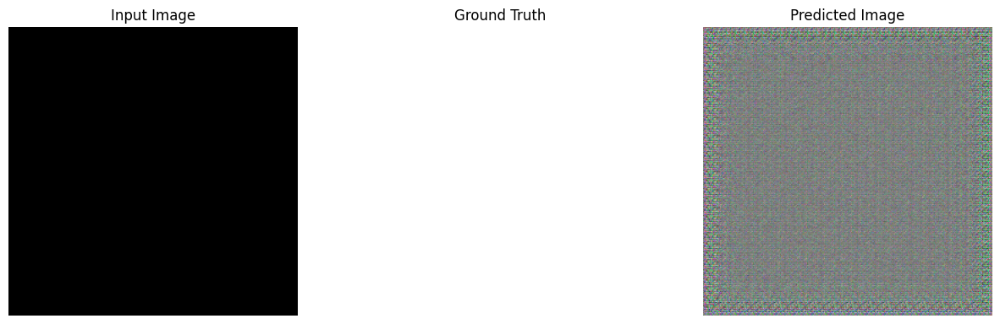

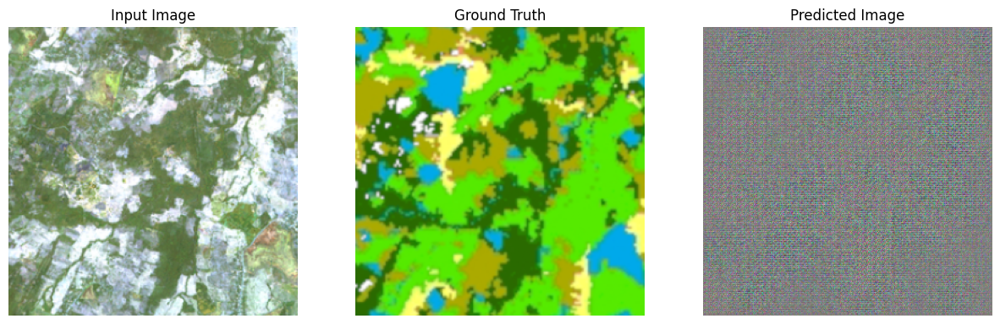

2024-07-29 23:23:28.576993: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [19]:
for example_input, example_target in test_dataset.take(5):
  generate_images(generator, example_input, example_target)

In [20]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [21]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)
    return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [22]:
def keepfit(train_ds, test_ds, steps, checkpoint_dir, checkpoint_prefix, generator, checkpoint_manager):
    # Load the latest checkpoint
    latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
    start_step = 0
    
    if latest_checkpoint:
        print(f"Restoring from checkpoint: {latest_checkpoint}")
        checkpoint.restore(latest_checkpoint)
        # Extract the step number from the checkpoint file name
        start_step = int(latest_checkpoint.split('-')[-1])
        print(f"Resuming from step: {start_step}")
    else:
        print("No checkpoint found. Starting from scratch.")

    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps - start_step).enumerate():
        current_step = start_step + step

        # Call train_step and get loss values
        gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, current_step)

        if (current_step + 1) % 1000 == 0:
            display.clear_output(wait=True)
            
            print(f'Step: {current_step+1}')
           
            print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec')
            print(f'Generator Total Loss: {gen_total_loss:.4f}')
            print(f'Generator GAN Loss: {gen_gan_loss:.4f}')
            print(f'Generator L1 Loss: {gen_l1_loss:.4f}')
            print(f'Discriminator Loss: {disc_loss:.4f}\n')
            
            # Generate and display images
            for inp, tar in test_dataset.take(3):
              generate_images(generator, inp, tar)
            
            # Reset timer
            start = time.time()

        # Training step indicator
        if (current_step+1) % 10 == 0:
            print('.', end='', flush=True)
        
        # Save (checkpoint) the model every 5k steps
        if (current_step + 1) % 5000 == 0:
            checkpoint_manager.save()
            print(f"\nCheckpoint saved at step {current_step + 1}")

    # Save a final checkpoint
    checkpoint_manager.save()
    print(f"\nFinal checkpoint saved at step {steps}")


In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")



checkpoint = tf.train.Checkpoint(generator=generator,
                                 discriminator=discriminator,
                                 generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)

# Call the fit function
keepfit(train_dataset, test_dataset, steps=100000, checkpoint_dir=checkpoint_dir, 
    checkpoint_prefix=checkpoint_prefix, generator=generator, checkpoint_manager=checkpoint_manager)

No checkpoint found. Starting from scratch.


2024-07-29 23:22:51.797394: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:7: Filling up shuffle buffer (this may take a while): 717 of 3400


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 128, 128,  │      3,072 │ input_layer_2[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 64, 64,    │    131,584 │ sequential_2[0][… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 32, 32,    │    525,312 │ sequential_3[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 16, 16,    │  2,099,200 │ sequential_4[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 8, 8, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 4, 4, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 1, 1, 512) │  4,196,352 │ sequential_8[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 2, 2, 512) │  4,196,352 │ sequential_9[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_8[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_11[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_7[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_12       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_12[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_13       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_13[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

None


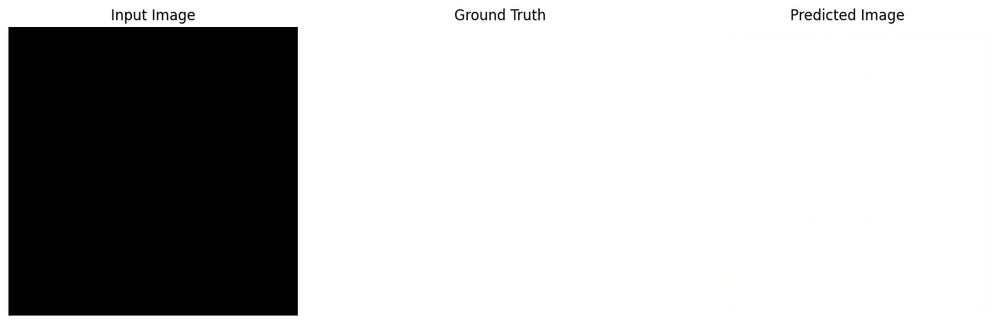

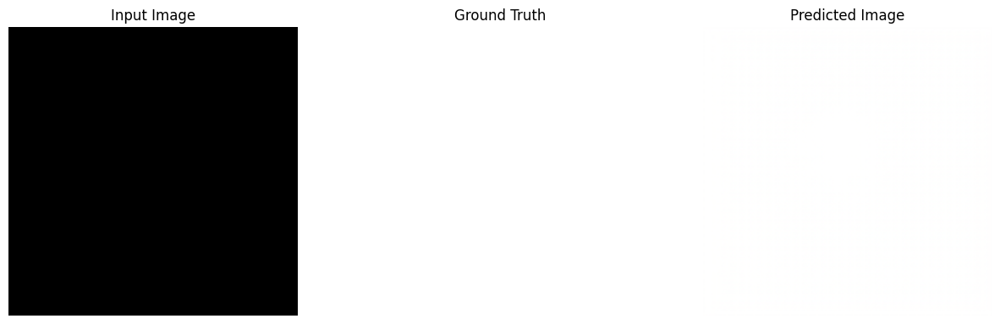

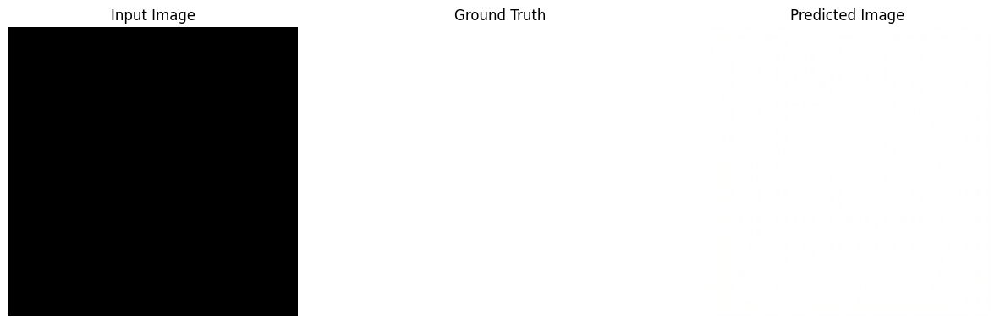

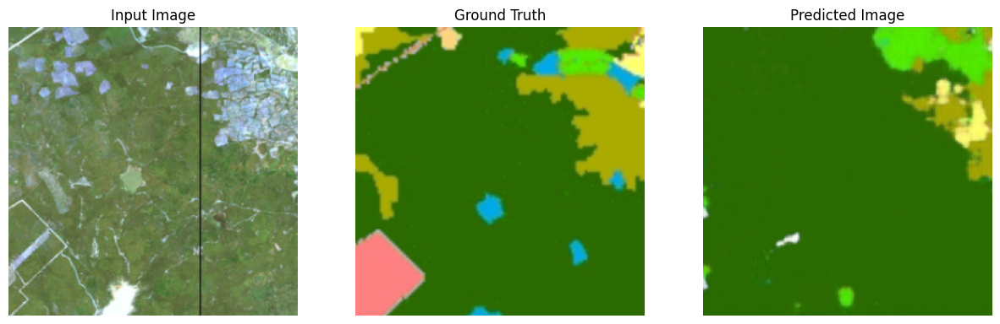

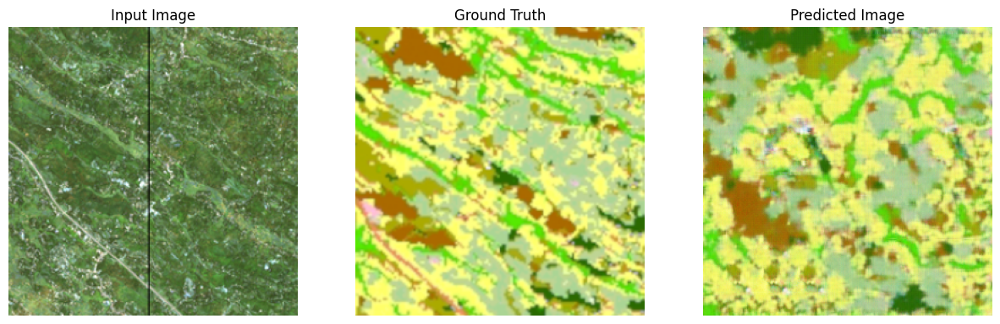

2024-07-29 23:23:48.458544: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [22]:
print(generator.summary())
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)
  

In [21]:
# Load the latest checkpoint
checkpoint_dir = os.path.join(PATH, 'checkpoints')
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

checkpoint = tf.train.Checkpoint(generator=generator)
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
    
if latest_checkpoint:
    print(f"Restoring from checkpoint: {latest_checkpoint}")
    checkpoint.restore(latest_checkpoint).expect_partial()
else:
    raise ValueError("No checkpoint found. Please provide a valid checkpoint directory.")
    
print(generator.summary())

Restoring from checkpoint: /mnt/d/Sri Lanka Land Use/scripts/Checked/checkpoints/ckpt-238


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 128, 128,  │      3,072 │ input_layer_2[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 64, 64,    │    131,584 │ sequential_2[0][… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 32, 32,    │    525,312 │ sequential_3[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 16, 16,    │  2,099,200 │ sequential_4[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 8, 8, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 4, 4, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 1, 1, 512) │  4,196,352 │ sequential_8[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 2, 2, 512) │  4,196,352 │ sequential_9[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_8[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_11[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_7[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_12       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_12[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_13       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_13[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

None


In [23]:
#more efficient
#use this load function and the generate_images_infer function 



def load_infer(image_tile):
    try:
        image_tile = tf.convert_to_tensor(image_tile, dtype=tf.string)
        image_tile = tf.io.decode_jpeg(image_tile)
        # Read and decode the input image file to a uint8 tensor
        # Convert both images to float32 tensors
        image_tile = tf.cast(image_tile, tf.float32)
 
        return image_tile
    except Exception as e:
        print(f"Error processing image {image_tile}: {str(e)}")
        return None


def generate_images_infer(model, test_input):
  prediction = model(test_input, training=True)
  return(prediction)

  
def remove_pink_and_red(image):
  # Store original dtype and shape
  original_dtype = image.dtype
  original_shape = image.shape

  # Ensure the image is a float tensor for calculations
  image = tf.cast(image, tf.float32)
    
  # Handle both 3D and 4D tensors
  if len(image.shape) == 4:
    # For batched input
    red, green, blue = tf.split(image, 3, axis=-1)
  elif len(image.shape) == 3:
    # For single image input
    red, green, blue = tf.split(image, 3, axis=-1)
    image = tf.expand_dims(image, 0)  # Add batch dimension temporarily
  else:
    raise ValueError("Input tensor must be 3D (single image) or 4D (batch of images)")
    
  # Calculate the maximum of green and blue channels
  max_gb = tf.maximum(green, blue)
    
  # Find pixels where red is the dominant color
  red_dominant = tf.logical_and(tf.greater(red, max_gb), tf.greater(red, 0.392))  # 0.392 ~= 100/255
    
  # Create a white mask
  white = tf.constant([1.0, 1.0, 1.0], dtype=tf.float32)
    
  # Apply the white mask to red/pink pixels
  image = tf.where(red_dominant, white, image)
    
  # Remove temporary batch dimension if added
  if len(original_shape) == 3:
    image = tf.squeeze(image, axis=0)
    
  # Cast back to original dtype
  image = tf.cast(image, original_dtype)
        
  return image



In [1]:
#deprecated


def process_image_with_model(input_image_path, output_image_path, generator):
    # Open the input image file and convert to RGB if necessary
    with Image.open(input_image_path) as img:
        if img.mode == 'RGBA':
            img = img.convert('RGB')
        elif img.mode != 'RGB':
            raise ValueError(f"Unsupported image mode: {img.mode}. Only RGB images are supported.")
        
        # Load the entire image into memory
        input_array = np.array(img)
    
    print("Opened the input image file and converted to RGB if necessary")
    
    height, width, channels = input_array.shape
    tile_size = 256
    
    # Calculate the number of tiles in each dimension
    tiles_x = math.ceil(width / tile_size)
    tiles_y = math.ceil(height / tile_size)
    total_tiles = tiles_x * tiles_y
    
    # Create the output array
    output_array = np.zeros((height, width, channels), dtype=np.uint8)
    print("Output array created")
    
    def process_tile(x, y):
        # Calculate tile coordinates
        x_start, y_start = x * tile_size, y * tile_size
        x_end, y_end = min(x_start + tile_size, width), min(y_start + tile_size, height)
        
        # Extract tile
        tile = input_array[y_start:y_end, x_start:x_end]
        
        # Get the original tile shape
        original_shape = tile.shape
        
        # Pad tile if necessary
        if tile.shape[:2] != (tile_size, tile_size):
            padded_tile = np.zeros((tile_size, tile_size, channels), dtype=np.uint8)
            padded_tile[:tile.shape[0], :tile.shape[1]] = tile
            tile = padded_tile
        
        # Convert numpy array to TensorFlow tensor
        tile_tensor = tf.convert_to_tensor(tile, dtype=tf.float32) / 255.0
        tile_tensor = tf.expand_dims(tile_tensor, 0)  # Add batch dimension
        
        # Generate output using the model
        generated_tile = generate_images_infer(generator, tile_tensor)
        generated_tile = remove_pink_and_red(generated_tile)
        
        # Convert generated tile back to numpy array if necessary
        if isinstance(generated_tile, tf.Tensor):
            generated_tile = (generated_tile[0] * 255).numpy().astype(np.uint8)
        
        # Resize generated tile to original shape if it was padded
        if original_shape[:2] != (tile_size, tile_size):
            generated_tile = generated_tile[:original_shape[0], :original_shape[1]]
        
        # Place the generated tile in the output array
        output_array[y_start:y_end, x_start:x_end] = generated_tile
    
    # Process all tiles with a progress bar
    with tqdm(total=total_tiles, desc="Processing tiles") as pbar:
        for y in range(tiles_y):
            for x in range(tiles_x):
                process_tile(x, y)
                pbar.update(1)
    
    # Save the output image
    output_image = Image.fromarray(output_array)
    output_image.save(output_image_path)
    print(f"Output image saved to {output_image_path}")



In [ ]:

input_filename = os.path.join(PATH, 'inputmap', 'lkoptical2.png')
output_filename = os.path.join(PATH, 'inputmap', 'output2018_2.png')


process_image_with_model(input_filename, output_filename, generator)

In [24]:
#Uses OpenCV (Otsu's) to smoothen image on a tile-by-tile basis
def segment_image(image, threshold=10):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply threshold
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Noise removal
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    
    # Sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    
    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)
    
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Marker labelling
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    # Apply watershed algorithm
    markers = cv2.watershed(image, markers)
    
    # Create a mask of the segmented regions
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for label in np.unique(markers):
        if label == -1:
            continue
        mask[markers == label] = label
    
    # Color each segment with its mean color
    result = np.zeros_like(image)
    for label in np.unique(mask):
        if label == 0:
            continue
        result[mask == label] = np.mean(image[mask == label], axis=0)
    
    return result

def process_image_with_model(input_image_path, output_image_path, generator):
    # Open the input image file and convert to RGB if necessary
    with Image.open(input_image_path) as img:
        if img.mode == 'RGBA':
            img = img.convert('RGB')
        elif img.mode != 'RGB':
            raise ValueError(f"Unsupported image mode: {img.mode}. Only RGB images are supported.")
        
        # Load the entire image into memory
        input_array = np.array(img)
    
    print("Opened the input image file and converted to RGB if necessary")
    
    height, width, channels = input_array.shape
    tile_size = 256
    
    # Calculate the number of tiles in each dimension
    tiles_x = math.ceil(width / tile_size)
    tiles_y = math.ceil(height / tile_size)
    total_tiles = tiles_x * tiles_y
    
    # Create the output array
    output_array = np.zeros((height, width, channels), dtype=np.uint8)
    print("Output array created")
    
    def process_tile(x, y):
        # Calculate tile coordinates
        x_start, y_start = x * tile_size, y * tile_size
        x_end, y_end = min(x_start + tile_size, width), min(y_start + tile_size, height)
        
        # Extract tile
        tile = input_array[y_start:y_end, x_start:x_end]
        
        # Get the original tile shape
        original_shape = tile.shape
        
        # Pad tile if necessary
        if tile.shape[:2] != (tile_size, tile_size):
            padded_tile = np.zeros((tile_size, tile_size, channels), dtype=np.uint8)
            padded_tile[:tile.shape[0], :tile.shape[1]] = tile
            tile = padded_tile
        
        # Convert numpy array to TensorFlow tensor
        tile_tensor = tf.convert_to_tensor(tile, dtype=tf.float32) / 255.0
        tile_tensor = tf.expand_dims(tile_tensor, 0)  # Add batch dimension
        
        # Generate output using the model
        generated_tile = generate_images_infer(generator, tile_tensor)
        generated_tile = remove_pink_and_red(generated_tile)
        
        # Convert generated tile back to numpy array if necessary
        if isinstance(generated_tile, tf.Tensor):
            generated_tile = (generated_tile[0] * 255).numpy().astype(np.uint8)
        
        # Apply segmentation to the generated tile
        segmented_tile = segment_image(generated_tile)
        
        # Resize generated tile to original shape if it was padded
        if original_shape[:2] != (tile_size, tile_size):
            segmented_tile = segmented_tile[:original_shape[0], :original_shape[1]]
        
        # Place the segmented tile in the output array
        output_array[y_start:y_end, x_start:x_end] = segmented_tile
    
    # Process all tiles with a progress bar
    with tqdm(total=total_tiles, desc="Processing tiles") as pbar:
        for y in range(tiles_y):
            for x in range(tiles_x):
                process_tile(x, y)
                pbar.update(1)
    
    # Save the output image
    output_image = Image.fromarray(output_array)
    output_image.save(output_image_path)
    print(f"Output image saved to {output_image_path}")

In [33]:
#unnecessary
def segment_image(image, threshold=10):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply threshold
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Noise removal
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    
    # Sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    
    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)
    
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Marker labelling
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    # Apply watershed algorithm
    markers = cv2.watershed(image, markers)
    
    # Create a mask of the segmented regions
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for label in np.unique(markers):
        if label == -1:
            continue
        mask[markers == label] = label
    
    # Color each segment with its mean color
    result = np.zeros_like(image)
    for label in np.unique(mask):
        if label == 0:
            continue
        result[mask == label] = np.mean(image[mask == label], axis=0)
    
    return result

def process_image_with_model(input_image_path, output_image_path, generator):
    # Open the input image file and convert to RGB if necessary
    with Image.open(input_image_path) as img:
        if img.mode == 'RGBA':
            img = img.convert('RGB')
        elif img.mode != 'RGB':
            raise ValueError(f"Unsupported image mode: {img.mode}. Only RGB images are supported.")
        
        # Load the entire image into memory
        input_array = np.array(img)
    
    print("Opened the input image file and converted to RGB if necessary")
    
    height, width, channels = input_array.shape
    tile_size = 256
    
    # Calculate the number of tiles in each dimension
    tiles_x = math.ceil(width / tile_size)
    tiles_y = math.ceil(height / tile_size)
    total_tiles = tiles_x * tiles_y
    
    # Create the output array
    output_array = np.zeros((height, width, channels), dtype=np.uint8)
    print("Output array created")
    
    def process_tile(x, y):
        # Calculate tile coordinates
        x_start, y_start = x * tile_size, y * tile_size
        x_end, y_end = min(x_start + tile_size, width), min(y_start + tile_size, height)
        
        # Extract tile
        tile = input_array[y_start:y_end, x_start:x_end]
        
        # Get the original tile shape
        original_shape = tile.shape
        
        # Pad tile if necessary
        if tile.shape[:2] != (tile_size, tile_size):
            padded_tile = np.zeros((tile_size, tile_size, channels), dtype=np.uint8)
            padded_tile[:tile.shape[0], :tile.shape[1]] = tile
            tile = padded_tile
        
        # Convert numpy array to TensorFlow tensor
        tile_tensor = tf.convert_to_tensor(tile, dtype=tf.float32) / 255.0
        tile_tensor = tf.expand_dims(tile_tensor, 0)  # Add batch dimension
        
        # Generate output using the model
        generated_tile = generate_images_infer(generator, tile_tensor)
        generated_tile = remove_pink_and_red(generated_tile)
        
        # Convert generated tile back to numpy array if necessary
        if isinstance(generated_tile, tf.Tensor):
            generated_tile = (generated_tile[0] * 255).numpy().astype(np.uint8)
        
        # Resize generated tile to original shape if it was padded
        if original_shape[:2] != (tile_size, tile_size):
            generated_tile = generated_tile[:original_shape[0], :original_shape[1]]
        
        # Place the generated tile in the output array
        output_array[y_start:y_end, x_start:x_end] = generated_tile
    
    # Process all tiles with a progress bar
    with tqdm(total=total_tiles, desc="Processing tiles") as pbar:
        for y in range(tiles_y):
            for x in range(tiles_x):
                process_tile(x, y)
                pbar.update(1)
    
    # Apply segmentation to the entire output image
    print("Applying segmentation to the entire image...")
    segmented_output = segment_image(output_array)
    
    # Save the segmented output image
    output_image = Image.fromarray(segmented_output)
    output_image.save(output_image_path)
    print(f"Segmented output image saved to {output_image_path}")

In [32]:
input_filename = os.path.join(PATH, 'finalmaps', '2024.png')
output_filename = os.path.join(PATH, 'finalmaps', '2024_landuse.png')
process_image_with_model(input_filename, output_filename, generator)

Opened the input image file and converted to RGB if necessary
Output array created


Processing tiles: 100%|███████████████████████████████████████████████████████████| 17784/17784 [30:08<00:00,  9.83it/s]


Output image saved to /mnt/d/Sri Lanka Land Use/scripts/Checked/finalmaps/2024_landuse.png
